# Predict spatial position (r) from gene expression — held-out validation

Reuses everything already generated by `find_spatial_grad_gene_MSN_types.ipynb`:
the per-cell-type BICAN `.h5ad` files and the R-computed splines (`*_with_splines.csv`).
Nothing here rebuilds `adata` from the `.qs` files and nothing redraws splines.

Pipeline:
1. Load the already-built per-cell-type BICAN (healthy) objects and the XDP object, attach the already-computed splines (`r`, `d`).
2. Hold out **1 XDP donor + 2 healthy donors** as a test set that is untouched until the final evaluation.
3. On the remaining **train** donors only, compute the spatial-gradient correlation per cell type (same random-effects method as the source notebook), separately for health and XDP, and keep genes whose gradient **agrees** between the two (same sign, both significant, both reliably expressed).
4. Fit an ElasticNet regressor (donor-grouped CV) per cell type **on healthy training donors only** to predict `r`. XDP-train donors are used exclusively in step 3 for gene selection — they never contribute to the fitted weights.
5. Apply the frozen regressor to the held-out donors (and to the XDP-train donors, as a secondary check) and report how well it recovers their true spatial position.

In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.stats import rankdata, t as t_dist, norm, spearmanr
from statsmodels.stats.multitest import multipletests
from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score

BASE        = "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated"
SPLINE_DIR  = os.path.join(BASE, "for_splines")
XDP_H5AD    = "/home/gdallagl/myworkdir/XDP/data/_old/all_lib_adata_zoned_ct-cured_aligned_cloudcompare.h5ad"
XDP_DONORS  = ["SCF-20-025", "SCF-19-014", "SCF-20-024", "SCF-20-026"]  # complete diseased STR donors

RANDOM_SEED = 0
CELL_TYPES  = ["Matrix", "Patch", "eMSN_D1D2"]

## 1. Load already-generated data (no re-derivation)

In [2]:
msn_type_files = {
    "eMSN_D1D2": "eMSN_D1D2.h5ad",
    "Patch_D1":  "Patch_D1.h5ad",
    "Patch_D2":  "Patch_D2.h5ad",
    "Matrix_D1": "Matrix_D1.h5ad",
    "Matrix_D2": "Matrix_D2.h5ad",
}
ct_map = {
    "eMSN_D1D2": "eMSN_D1D2", "Matrix_D1": "Matrix", "Matrix_D2": "Matrix",
    "Patch_D1": "Patch", "Patch_D2": "Patch",
}

d1d2 = sc.read_h5ad(os.path.join(BASE, msn_type_files["eMSN_D1D2"]))
d1d2_samples = d1d2.obs["donor_id"].unique().tolist()  # cohort of healthy donors we have eMSN for

processed = [d1d2]
for cell_type, fname in msn_type_files.items():
    if cell_type == "eMSN_D1D2":
        continue
    ad = sc.read_h5ad(os.path.join(BASE, fname), backed="r")
    ad = ad[ad.obs["donor_id"].isin(d1d2_samples), :].to_memory().copy()  # keep only donors present in eMSN_D1D2
    processed.append(ad)

adata = sc.concat(processed)
adata.obs_names_make_unique()
adata.obs["ct"] = adata.obs["ct_for_deg"].map(ct_map)
adata.layers["counts"] = adata.X.copy()

print(adata)
print(adata.obs["donor_id"].value_counts())

AnnData object with n_obs × n_vars = 118710 × 37905
    obs: 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_label', 'Neighborhood_name', 'Class_label', 'Class_name', 'Subclass_label', 'Subclass_name', 'Group_label', 'Group_name', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'library', 'unique_cell_ID', 'zone', 'ct_for_deg', 'ct'
    obsm: 'spatial'
    layers: 'counts'
donor_id
s23    12434
s37    11150
s31     9986
s5      8800
s38     8567
s12     7971
s15     7120
s35     6466
s26     5243
s34     5093
s16     4977
s36     4783
s32     4685
s21     4570
s33     4271
s17     3853
s18     3520
s29     3416
s20     1805
Name: count, dtype: int64


In [3]:
xdp_adata = sc.read_h5ad(XDP_H5AD, backed="r")

xdp_adata_sub = xdp_adata[
    (xdp_adata.obs["ct_for_deg"].isin(["Matrix_D1", "Matrix_D2", "Patch_D1", "Patch_D2", "eMSN_D1D2"])) &
    (xdp_adata.obs["donor_id"].notna()) &
    (xdp_adata.obs["donor_id"].isin(XDP_DONORS)) &
    (xdp_adata.obs["x"].notna() & xdp_adata.obs["y"].notna())
].to_memory().copy()

xdp_adata_sub.obs["ct"] = xdp_adata_sub.obs["ct_for_deg"].map(ct_map)
xdp_adata_sub.obs[["x", "y"]] = xdp_adata_sub.obsm["spatial"].copy()
xdp_adata_sub = xdp_adata_sub[xdp_adata_sub.obs["x"].notna() & xdp_adata_sub.obs["y"].notna()].copy()

xdp_adata_sub.var_names = xdp_adata_sub.var["gene_symbol"].astype(str).copy()
xdp_adata_sub.var_names_make_unique()

# same inherited assumption as the source notebook: for Matrix/Patch keep only the
# histologically-healthy-looking tissue in the XDP donors; eMSN is kept regardless of the
# per-cell "region" (health) label, since it's treated as the less-affected reference population
xdp_adata_sub = xdp_adata_sub[
    (xdp_adata_sub.obs["ct"].isin(["Matrix", "Patch"]) & (xdp_adata_sub.obs["region"] == "healthy")) |
    (xdp_adata_sub.obs["ct"].isin(["eMSN_D1D2"]))
].copy()

print(xdp_adata_sub)
print(xdp_adata_sub.obs["donor_id"].value_counts())

AnnData object with n_obs × n_vars = 16672 × 37464
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_id', 'donor_number', 'donor_id', 'condition', 'sex', 'age_at_onset', 'age_at_death', 'bcl', 'library', 'Sorted', 'mapping_coupling_for_zoning', 'zone', 'zone_probability', 'mapping_coupling_for_zoning_4_zones', 'zone_4', 'zone_4_probability', 'leiden_0.1_all_ce

Attach the splines that were already computed in R (`for_splines/*_with_splines.csv`). Note: the anatomical `caudate`/`putamen` label derived from `d` is stored as `anat_region`, kept deliberately separate from the pre-existing tissue-health `region` column (`healthy`/`dead`) used above — the source notebook reuses the `region` name for both meanings, which is a footgun if cells are re-run out of order.

In [4]:
adata.obs["r"] = np.nan
adata.obs["d"] = np.nan
xdp_adata_sub.obs["r"] = np.nan
xdp_adata_sub.obs["d"] = np.nan

for a in [xdp_adata_sub, adata]:
    for s in a.obs["donor_id"].dropna().unique():
        csv_path = os.path.join(SPLINE_DIR, f"{s}_x_y_with_splines.csv")
        if not os.path.exists(csv_path):
            print(f"Donor {s} - spline file not found, skipping ...")
            continue

        df_spline = pd.read_csv(csv_path, index_col=0)
        df_spline.index = df_spline.index.astype(str)
        df_spline["r_original"] = df_spline["r"].copy()
        df_spline["r"] = df_spline["r"] / df_spline["r"].max()

        common_idx = df_spline.index.intersection(a.obs_names)
        missing = df_spline.index.difference(a.obs_names)
        if len(missing) > 0:
            print(f"Donor {s} - {len(missing)}/{len(df_spline)} spline barcodes not found in adata, skipping those")

        a.obs.loc[common_idx, "r"] = df_spline.loc[common_idx, "r"]
        a.obs.loc[common_idx, "d"] = df_spline.loc[common_idx, "d"]

adata.obs["anat_region"] = np.where(adata.obs["d"] < 0, "caudate", "putamen")
xdp_adata_sub.obs["anat_region"] = np.where(xdp_adata_sub.obs["d"] < 0, "caudate", "putamen")

adata = adata[adata.obs["r"].notna()].copy()
xdp_adata_sub = xdp_adata_sub[xdp_adata_sub.obs["r"].notna()].copy()

print(f"adata: {adata.shape}, donors: {adata.obs['donor_id'].nunique()}")
print(f"xdp_adata_sub: {xdp_adata_sub.shape}, donors: {xdp_adata_sub.obs['donor_id'].nunique()}")

Donor SCF-20-025 - 38/6591 spline barcodes not found in adata, skipping those
Donor s5 - 655/9455 spline barcodes not found in adata, skipping those
Donor s12 - 688/8659 spline barcodes not found in adata, skipping those
Donor s15 - 414/7534 spline barcodes not found in adata, skipping those
Donor s16 - 401/5378 spline barcodes not found in adata, skipping those
Donor s17 - 150/4003 spline barcodes not found in adata, skipping those
Donor s18 - 344/3864 spline barcodes not found in adata, skipping those
Donor s20 - 106/1911 spline barcodes not found in adata, skipping those
Donor s21 - 394/4964 spline barcodes not found in adata, skipping those
Donor s23 - 869/13303 spline barcodes not found in adata, skipping those
Donor s26 - 169/5412 spline barcodes not found in adata, skipping those
Donor s29 - 245/3661 spline barcodes not found in adata, skipping those
Donor s31 - 579/10565 spline barcodes not found in adata, skipping those
Donor s32 - 323/5008 spline barcodes not found in adata, 

Standard normalization (same as the source notebook's `process_adata`): drop genes still named by their Ensembl fallback ID, restore raw counts, `normalize_total` + `log1p`.

In [5]:
def process_adata(adata):
    adata = adata[:, ~adata.var_names.str.startswith("ENS")].copy()
    adata.X = adata.layers["counts"].copy()
    sc.pp.filter_genes(adata, min_cells=1)
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.layers["log1p_norm"] = adata.X.copy()
    return adata

adata = process_adata(adata)
xdp_adata_sub = process_adata(xdp_adata_sub)

common_genes = adata.var_names.intersection(xdp_adata_sub.var_names)
adata = adata[:, common_genes].copy()
xdp_adata_sub = xdp_adata_sub[:, common_genes].copy()
print(f"{len(common_genes)} genes shared between the two cohorts after filtering")

23630 genes shared between the two cohorts after filtering


## 2. Train / test split — hold out 1 XDP donor + 2 healthy donors

These donors are **not used anywhere below** until the final evaluation section.

In [6]:
rng = np.random.default_rng(RANDOM_SEED)

healthy_donors = sorted(adata.obs["donor_id"].dropna().unique())
xdp_donors     = sorted(xdp_adata_sub.obs["donor_id"].dropna().unique())

TEST_HEALTHY_DONORS = ["s5", "s12"]
TEST_XDP_DONORS     = ["SCF-20-024"]  # held-out donors for testing the regressor

TRAIN_HEALTHY_DONORS = [d for d in healthy_donors if d not in TEST_HEALTHY_DONORS]
TRAIN_XDP_DONORS     = [d for d in xdp_donors if d not in TEST_XDP_DONORS]

print(f"Healthy donors — train: {len(TRAIN_HEALTHY_DONORS)}, test (held out): {TEST_HEALTHY_DONORS}")
print(f"XDP donors     — train: {len(TRAIN_XDP_DONORS)}, test (held out): {TEST_XDP_DONORS}")

adata_train = adata[adata.obs["donor_id"].isin(TRAIN_HEALTHY_DONORS)].copy()
adata_test  = adata[adata.obs["donor_id"].isin(TEST_HEALTHY_DONORS)].copy()

xdp_train = xdp_adata_sub[xdp_adata_sub.obs["donor_id"].isin(TRAIN_XDP_DONORS)].copy()
xdp_test  = xdp_adata_sub[xdp_adata_sub.obs["donor_id"].isin(TEST_XDP_DONORS)].copy()

print(f"\ntrain cells — healthy: {adata_train.n_obs}, xdp: {xdp_train.n_obs}")
print(f"test  cells — healthy: {adata_test.n_obs}, xdp: {xdp_test.n_obs}")

Healthy donors — train: 16, test (held out): ['s5', 's12']
XDP donors     — train: 3, test (held out): ['SCF-20-024']



train cells — healthy: 96846, xdp: 13647
test  cells — healthy: 16771, xdp: 3025


## 3. Spatial-gradient genes on TRAIN donors only, kept if they agree between health and XDP

`calc_spatial_corr_multi_donor` is copied verbatim from the source notebook: per-donor Spearman rank correlation between gene expression and `r`, combined across donors with a random-effects (DerSimonian–Laird) meta-analysis on Fisher-z so a big donor can't dominate small ones.

In [7]:
def calc_spatial_corr_multi_donor(adata, metric_key="r", donor_col="donor_id", min_cells=20):

    X_full = adata.layers["log1p_norm"]
    X_full = X_full.toarray() if sparse.issparse(X_full) else np.asarray(X_full, dtype=float)

    donor_rhos, donor_ncells = {}, {}

    for donor in adata.obs[donor_col].unique():
        mask = (adata.obs[donor_col] == donor).values
        r    = adata.obs.loc[mask, metric_key].values.astype(float)
        valid = ~np.isnan(r)

        if valid.sum() < min_cells:
            continue

        X = X_full[mask][valid]
        r = r[valid]

        Xr = rankdata(X, axis=0).astype(float)
        yr = rankdata(r).astype(float)
        Xr -= Xr.mean(axis=0)
        yr -= yr.mean()

        denom = np.sqrt((Xr**2).sum(axis=0) * (yr**2).sum())
        with np.errstate(divide="ignore", invalid="ignore"):
            rho = (Xr.T @ yr) / denom
        rho = np.where(denom == 0, 0.0, rho)

        donor_rhos[donor]   = rho
        donor_ncells[donor] = valid.sum()

    if len(donor_rhos) == 0:
        raise ValueError("Need at least 1 donor with data")

    genes      = adata.var_names
    donor_list = list(donor_rhos.keys())
    rho_matrix = np.array([donor_rhos[d] for d in donor_list])

    if len(donor_rhos) == 1:
        rho_combined = rho_matrix[0]
        n = donor_ncells[donor_list[0]]
        with np.errstate(divide="ignore", invalid="ignore"):
            tstat = rho_combined * np.sqrt((n - 2) / (1 - rho_combined**2))
        pval = 2 * t_dist.sf(np.abs(tstat), df=n - 2)
        pval = np.where(np.abs(rho_combined) >= 1, 0.0, pval)
    else:
        z_matrix = np.arctanh(np.clip(rho_matrix, -0.9999, 0.9999))
        n_cells  = np.array([donor_ncells[d] for d in donor_list], dtype=float)
        w_fixed  = np.clip(n_cells - 3, 1e-6, None)

        z_fixed = (w_fixed[:, None] * z_matrix).sum(axis=0) / w_fixed.sum()
        Q       = (w_fixed[:, None] * (z_matrix - z_fixed) ** 2).sum(axis=0)

        k    = len(donor_list)
        c    = w_fixed.sum() - (w_fixed ** 2).sum() / w_fixed.sum()
        tau2 = np.clip((Q - (k - 1)) / c, 0, None)

        w_re   = 1.0 / (1.0 / w_fixed[:, None] + tau2[None, :])
        z_mean = (w_re * z_matrix).sum(axis=0) / w_re.sum(axis=0)
        se     = np.sqrt(1.0 / w_re.sum(axis=0))

        rho_combined = np.tanh(z_mean)
        zstat = z_mean / se
        pval  = 2 * norm.sf(np.abs(zstat))

    df_summary = pd.DataFrame({"rho": rho_combined, "pval": pval, "n_donors": len(donor_rhos)}, index=genes)
    df_summary["padj"] = multipletests(df_summary["pval"].fillna(1), method="fdr_bh")[1]
    return df_summary


def expr_reliability_stats(adata, ct, metric_key="r"):
    """pct/mean expression, restricted to the SAME cells that entered the correlation
    test above (i.e. cells with a valid r) — unlike the source notebook, which computed
    this over the full cell-type population regardless of whether a cell had a spline r."""
    ad_ct = adata[(adata.obs["ct"] == ct) & (adata.obs[metric_key].notna())]
    counts = ad_ct.layers["counts"]
    counts = counts.toarray() if sparse.issparse(counts) else np.asarray(counts)
    return pd.DataFrame({
        "pct_expr":  (counts > 0).mean(axis=0),
        "mean_expr": counts.mean(axis=0),
    }, index=ad_ct.var_names)



In [8]:


corr_health_train, corr_xdp_train = {}, {}
expr_health_train, expr_xdp_train = {}, {}

for ct in CELL_TYPES:
    print(f"=== {ct} ===")
    corr_health_train[ct] = calc_spatial_corr_multi_donor(adata_train[adata_train.obs["ct"] == ct], metric_key="r")
    corr_xdp_train[ct]    = calc_spatial_corr_multi_donor(xdp_train[xdp_train.obs["ct"] == ct], metric_key="r")
    expr_health_train[ct] = expr_reliability_stats(adata_train, ct)
    expr_xdp_train[ct]    = expr_reliability_stats(xdp_train, ct)

=== Matrix ===


=== Patch ===
=== eMSN_D1D2 ===


In [9]:
THRESHOLD     = 0.15  # min |rho| to count as "has a spatial gradient"
PADJ_THR      = 0.05
MIN_PCT_EXPR  = 0.20
MIN_MEAN_EXPR = 1
THRESHOLD_ONLY = 0.1
THRESHOLD_SPECIFIC = 0.3  # min |rho| to count as "has a spatial gradient" in the held-out donor, for testing the regressor

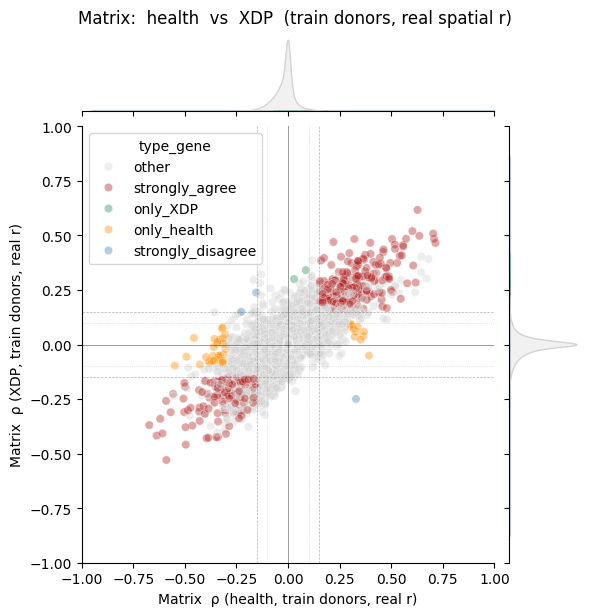

type_gene
other                23156
strongly_agree         429
only_health             40
strongly_disagree        3
only_XDP                 2
Name: Matrix: health vs XDP (train, real r), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
PDE8B,0.328997,4.727283e-13,-0.249458,0.008558,0.951325,12.991508,0.880263,6.224671,strongly_disagree
SPON1,-0.226219,2.773156e-15,0.150242,0.022360,0.719068,6.787018,0.662500,3.081798,strongly_disagree
LSAMP,-0.154708,2.135360e-06,0.238327,0.000016,0.999542,148.697703,0.998794,77.327083,strongly_disagree


only_health


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
GALNTL6,-0.549053,1.971725e-89,-0.096413,0.239693,0.958621,50.044078,0.992873,40.690899,only_health
ZNF83,-0.492653,2.095583e-102,-0.055536,0.783489,0.959334,12.632324,0.910307,6.556031,only_health
BRINP3,-0.455619,9.044769e-34,0.030141,0.784699,0.593593,6.884584,0.727412,4.368531,only_health
KIAA2012,-0.427801,2.891822e-91,-0.091875,0.032703,0.510568,1.538514,0.560636,1.229496,only_health
TMEFF2,-0.397326,9.973189e-63,-0.057299,0.144583,0.913002,8.813285,0.921820,7.756140,only_health
GRIN2A,0.392025,3.448961e-27,-0.050630,0.874916,0.778934,13.358216,0.736952,6.031908,only_health
FGF13,-0.382735,2.600102e-77,-0.083594,0.000069,0.967291,17.672112,0.956689,11.051096,only_health
MYRIP,-0.380936,1.807827e-130,-0.077691,0.000453,0.921762,10.048598,0.889474,5.383772,only_health
NAV3,-0.369719,6.223069e-41,-0.075874,0.400006,0.997148,60.774452,0.993860,33.935746,only_health
YARS1,0.367662,1.155801e-71,0.059111,0.585921,0.904217,4.349889,0.707785,1.663596,only_health


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
ADGRL3,0.085953,0.105889,0.341303,0.011109,0.999020,121.901836,0.998794,58.992982,only_XDP
IL1RAPL1,0.029362,0.543318,0.300342,0.005608,0.998867,172.058746,0.998136,73.683114,only_XDP


strongly_agree (same direction)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
PDE10A,0.714289,1.434114e-208,0.465388,8.710728e-04,0.998689,169.022116,0.997149,50.421930,strongly_agree
PLCB1,0.707569,7.880805e-200,0.484124,2.981627e-02,0.998268,206.972002,0.997588,70.708224,strongly_agree
ZNF385B,0.703342,2.257529e-112,0.508778,9.484546e-03,0.945125,98.953604,0.848026,23.846382,strongly_agree
PRKG1,-0.672548,2.842422e-140,-0.369366,1.062139e-04,0.893115,36.455858,0.983991,30.574561,strongly_agree
ARHGAP6,-0.636642,1.912384e-113,-0.417146,1.449059e-02,0.536210,3.967979,0.794846,6.345614,strongly_agree
...,...,...,...,...,...,...,...,...,...
JPH1,0.153372,6.667119e-11,0.245259,2.826019e-08,0.945685,8.282384,0.913816,6.765680,strongly_agree
FAT3,0.152972,8.198434e-07,0.277011,3.612503e-03,0.999682,138.528634,0.998684,68.132675,strongly_agree
SOD2,-0.152840,4.912888e-25,-0.158642,2.045831e-03,0.756232,2.032378,0.743750,1.882895,strongly_agree
NPTN,-0.152047,4.790675e-14,-0.249320,3.400868e-02,0.995289,19.351532,0.991228,16.852412,strongly_agree


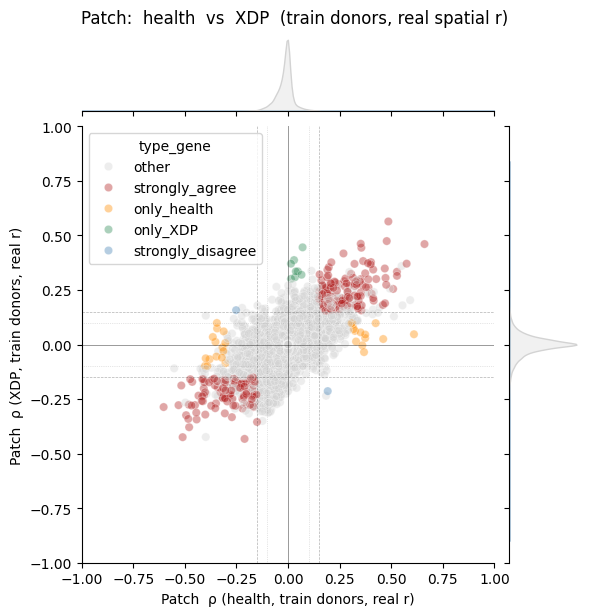

type_gene
other                23317
strongly_agree         274
only_health             29
only_XDP                 8
strongly_disagree        2
Name: Patch: health vs XDP (train, real r), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
MAGI2,-0.251669,1.711020e-18,0.157620,0.000002,0.999063,82.513666,0.995563,49.003754,strongly_disagree
NRGN,0.192237,9.720816e-15,-0.213472,0.048903,0.969207,8.690200,0.941638,7.280205,strongly_disagree


only_health


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
OPCML,0.610042,3.671484e-88,0.047315,0.920036,0.974832,86.140910,0.945051,33.050853,only_health
PDE8B,0.461071,4.227848e-31,0.025481,0.869802,0.898103,8.982981,0.783959,3.858362,only_health
ELL2,0.424541,1.522448e-32,0.098188,0.805307,0.697123,4.163193,0.565529,2.519113,only_health
PTPRQ,-0.401902,4.310647e-102,-0.097603,0.367222,0.808178,15.215980,0.794198,13.882253,only_health
ZNF83,-0.398959,2.140122e-73,-0.063099,0.726113,0.958246,10.208625,0.900683,5.553925,only_health
ST6GALNAC5,-0.391292,9.731175e-92,-0.098254,0.691847,0.988967,37.496791,0.981911,27.058362,only_health
LINGO2,-0.380160,2.202942e-47,-0.067076,0.003906,0.783948,35.531694,0.923549,23.915700,only_health
ENTPD3,0.373971,1.266997e-44,0.045782,0.797691,0.926372,9.805149,0.830034,4.503754,only_health
ARHGAP10,0.373690,7.606690e-47,0.029827,0.762196,0.637485,3.757770,0.437884,1.234471,only_health
SAMD5,0.368093,3.568313e-43,-0.034562,0.910230,0.347732,4.208553,0.158703,0.852218,only_health


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
LSAMP,0.070458,0.005953,0.445725,3.836539e-07,0.999928,272.333165,0.997952,127.701706,only_XDP
MT-ATP6,0.029060,0.621944,0.387268,6.500220e-03,0.802120,7.979448,0.662457,2.947782,only_XDP
MT-ND3,0.014143,0.832106,0.370789,3.142288e-03,0.698926,4.172856,0.434471,1.110922,only_XDP
MT-ND1,0.047294,0.362421,0.335436,5.705088e-03,0.851879,7.099228,0.725939,2.835495,only_XDP
PBX3,0.037726,0.119389,0.335136,8.853333e-18,0.997692,48.225716,0.987713,22.427986,only_XDP
SPATS2L,0.065093,0.043135,0.320105,8.036530e-68,0.689118,3.582029,0.596928,2.420137,only_XDP
MT-CYB,0.033182,0.630176,0.308449,2.685887e-04,0.926300,11.393957,0.872014,6.543345,only_XDP
MT-CO3,0.014144,0.846955,0.301031,4.008839e-03,0.935963,13.513233,0.907509,7.395563,only_XDP


strongly_agree (same direction)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
PDE10A,0.661036,1.631771e-167,0.460713,1.417928e-06,0.999712,258.817336,0.999317,92.442662,strongly_agree
RGS6,-0.602842,7.040159e-72,-0.286346,1.697547e-03,0.812216,17.109180,0.887713,11.962457,strongly_agree
RYR3,0.574512,8.385632e-83,0.370737,3.376128e-04,0.999928,145.430446,0.996928,64.098294,strongly_agree
ARHGAP6,-0.530625,9.412670e-139,-0.277803,3.678140e-02,0.406721,2.273743,0.648805,3.443686,strongly_agree
VLDLR-AS1,0.527761,9.268693e-81,0.315150,9.024933e-04,0.981106,20.165645,0.946075,8.308874,strongly_agree
...,...,...,...,...,...,...,...,...,...
CNKSR2,0.152288,7.459931e-14,0.197546,8.520439e-09,0.995962,61.647508,0.994881,38.615017,strongly_agree
MYH9,0.151481,9.496392e-11,0.243535,2.290967e-05,0.808899,2.605466,0.641980,1.690444,strongly_agree
RELN,0.150768,1.194723e-39,0.209951,4.817513e-05,0.965746,34.706570,0.903754,13.625939,strongly_agree
CAND1,-0.150514,8.315223e-16,-0.183782,6.332952e-04,0.905459,4.410543,0.900683,3.821160,strongly_agree


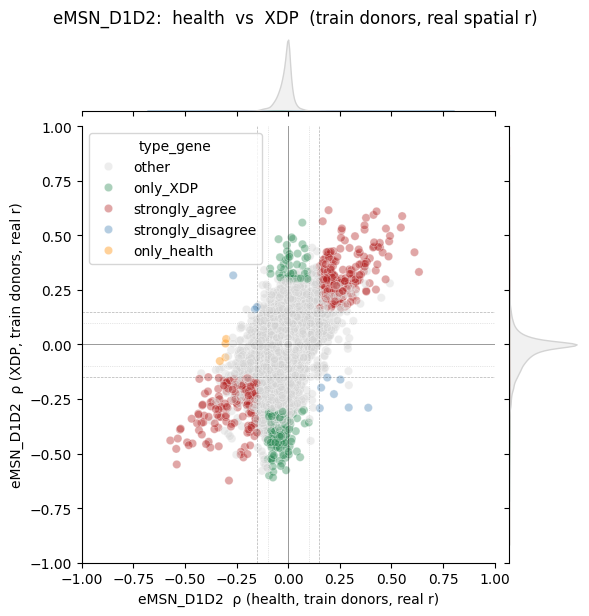

type_gene
other                23033
strongly_agree         355
only_XDP               228
strongly_disagree       10
only_health              4
Name: eMSN_D1D2: health vs XDP (train, real r), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
MALAT1,0.388081,2.391629e-15,-0.290205,4.112472e-13,1.000000,2922.198332,1.000000,1384.656230,strongly_disagree
CAMK2N1,0.293257,7.825948e-15,-0.289217,2.095423e-30,0.931711,9.281722,0.880401,4.291797,strongly_disagree
RBFOX1,-0.266445,3.190845e-09,0.316474,9.594712e-06,1.000000,626.279017,0.998748,317.281778,strongly_disagree
ATP2B1,0.252999,9.138780e-11,-0.160969,1.561256e-09,0.999098,87.547217,0.998748,34.402004,strongly_disagree
MIR124-1HG,0.221684,2.795066e-08,-0.227561,1.243950e-18,0.986703,14.949065,0.964308,10.184095,strongly_disagree
NAP1L1,0.189346,6.086170e-17,-0.151787,1.506915e-08,0.992788,25.653595,0.971196,10.519724,strongly_disagree
RPS6KA2,-0.161227,1.859760e-09,0.160949,1.175147e-03,0.998422,58.063106,0.995617,40.273012,strongly_disagree
DLX6-AS1,0.159705,1.050090e-06,-0.198108,8.878361e-03,0.938247,13.393960,0.839073,4.295554,strongly_disagree
KCNAB1,0.153048,6.164749e-05,-0.292377,4.283794e-31,0.913680,5.257156,0.743895,2.133375,strongly_disagree
LINC01250,-0.151548,2.875148e-13,0.171539,3.352893e-04,0.979040,16.286906,0.954289,10.226049,strongly_disagree


only_health


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
SLIT1,-0.331394,6.294352e-24,-0.076252,0.009830,0.952445,7.688979,0.943644,6.542893,only_health
FSTL5,-0.304110,1.411336e-40,-0.059215,0.059337,0.988506,40.580798,0.964934,16.751409,only_health
CSMD1,-0.303701,2.834774e-16,0.004134,1.000000,0.998422,148.825558,0.996869,84.531622,only_health
GRIA1,-0.300600,7.319049e-24,0.024971,0.780404,0.998648,37.288258,0.994991,22.051346,only_health


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
VAMP2,-0.073778,0.136919,-0.609823,1.458552e-54,0.866351,4.857561,0.805260,4.058860,only_XDP
HSP90AB1,-0.092537,0.083371,-0.600681,1.243822e-21,0.898805,6.339644,0.834064,5.621165,only_XDP
NORAD,-0.072436,0.169323,-0.583846,3.869010e-56,0.844039,4.793780,0.778961,4.067627,only_XDP
CALM1,-0.010221,0.968935,-0.576553,6.511434e-18,0.986703,24.020509,0.961803,16.618034,only_XDP
SARAF,-0.074864,0.076491,-0.560229,5.452187e-83,0.867478,3.860717,0.770194,2.867877,only_XDP
...,...,...,...,...,...,...,...,...,...
PAQR3,0.075929,0.012197,-0.300971,4.880291e-33,0.919089,5.592067,0.867251,4.250470,only_XDP
TSPEAR,0.093157,0.074505,0.300755,2.144145e-09,0.599053,2.489971,0.561678,2.074515,only_XDP
DANCR,-0.018601,0.557173,-0.300575,6.018344e-33,0.368718,0.520171,0.557921,1.047589,only_XDP
CUX1,0.009568,0.912568,0.300343,1.515991e-09,0.968898,8.358125,0.902943,4.220413,only_XDP


strongly_agree (same direction)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
CNR1,0.633511,2.659557e-75,0.332223,2.613155e-23,0.918639,19.905116,0.811522,4.581716,strongly_agree
ELL2,0.611821,5.245626e-104,0.422360,1.229418e-07,0.597025,4.377282,0.484033,1.886036,strongly_agree
NDST3,-0.571196,3.302567e-80,-0.440262,9.226843e-06,0.556682,6.158891,0.584220,3.500939,strongly_agree
MCTP1,0.552182,7.574847e-32,0.588186,5.574286e-11,0.992337,86.192923,0.946149,21.688791,strongly_agree
KCNT1,0.545802,9.695185e-57,0.536016,7.186532e-10,0.924273,7.611675,0.797120,3.940513,strongly_agree
...,...,...,...,...,...,...,...,...,...
METTL15,-0.151171,2.190625e-15,-0.174699,5.524273e-06,0.810007,3.822853,0.722605,2.482780,strongly_agree
TTC8,-0.151161,2.300138e-08,-0.233502,1.375931e-18,0.829164,3.692360,0.690044,1.907952,strongly_agree
GFOD1,0.150933,2.979761e-05,0.185430,1.789721e-12,0.967771,11.168582,0.914840,5.814026,strongly_agree
AKAP9,0.150754,2.684699e-12,0.174000,1.478248e-04,0.991436,13.661032,0.959925,6.400751,strongly_agree


In [10]:
def merge_health_xdp_train(ct):
    corr_h, corr_x = corr_health_train[ct], corr_xdp_train[ct]
    expr_h, expr_x = expr_health_train[ct], expr_xdp_train[ct]
    common = corr_h.index.intersection(corr_x.index)

    return pd.DataFrame({
        "rho_health":       corr_h.loc[common, "rho"],
        "padj_health":      corr_h.loc[common, "padj"],
        "rho_xdp":          corr_x.loc[common, "rho"],
        "padj_xdp":         corr_x.loc[common, "padj"],
        "pct_expr_health":  expr_h.loc[common, "pct_expr"],
        "mean_expr_health": expr_h.loc[common, "mean_expr"],
        "pct_expr_xdp":     expr_x.loc[common, "pct_expr"],
        "mean_expr_xdp":    expr_x.loc[common, "mean_expr"],
    })


palette = {
    "strongly_agree":    "firebrick",
    "strongly_disagree": "steelblue",
    "only_health":       "darkorange",
    "only_XDP":          "seagreen",
    "other":             "lightgray",
}

health_xdp_train_tables = {ct: merge_health_xdp_train(ct) for ct in CELL_TYPES}

for ct, df in health_xdp_train_tables.items():
    rho_cx, rho_cy = "rho_health", "rho_xdp"

    x, y   = df[rho_cx], df[rho_cy]
    sig_x  = df["padj_health"] < PADJ_THR
    sig_y  = df["padj_xdp"]    < PADJ_THR
    expr_x = (df["pct_expr_health"] >= MIN_PCT_EXPR) & (df["mean_expr_health"] >= MIN_MEAN_EXPR)
    expr_y = (df["pct_expr_xdp"]    >= MIN_PCT_EXPR) & (df["mean_expr_xdp"]    >= MIN_MEAN_EXPR)

    has_x  = (x.abs() >= THRESHOLD)  & sig_x & expr_x
    has_y  = (y.abs() >= THRESHOLD)  & sig_y & expr_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & flat_y  & sig_x & expr_x
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & flat_x  & sig_y & expr_y

    df = df.copy()
    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = "only_health"
    df.loc[only_y,            "type_gene"] = "only_XDP"

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct}  ρ (health, train donors, real r)")
    g.ax_joint.set_ylabel(f"{ct}  ρ (XDP, train donors, real r)")
    g.figure.suptitle(f"{ct}:  health  vs  XDP  (train donors, real spatial r)", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct}: health vs XDP (train, real r)"))
    print("strongly_disagree (reversed)")
    display(df[df["type_gene"] == "strongly_disagree"].sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print("only_health")
    display(df[df["type_gene"] == "only_health"].sort_values(rho_cx, key=np.abs, ascending=False))
    print("only_XDP")
    display(df[df["type_gene"] == "only_XDP"].sort_values(rho_cy, key=np.abs, ascending=False))
    print("strongly_agree (same direction)")
    display(df[df["type_gene"] == "strongly_agree"].sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))

    changed = df[df["type_gene"].isin(["strongly_disagree", "only_health", "only_XDP"])]


### FInd genes to use fro clautg score

reliable — is the gene actually detected well enough to trust, in both cohorts? (expressed in ≥20% of cells, and not near-zero mean expression). Filters out genes so rare that any "correlation" is just a handful of cells making noise.

sig — is the correlation with spatial position statistically significant (padj < 0.05) in both health and XDP? Not just "some positive number," but a correlation unlikely to be chance.

graded — is the correlation strong in both (|rho| ≥ 0.3)? A gene can be statistically significant but only weakly graded (e.g. rho=0.05 with huge cell counts) — this filters those out, keeping only genes with a real, sizeable spatial gradient.

agrees — do the two gradients point the same direction? (sign(rho_health) == sign(rho_xdp)) — e.g. both increase from ventral→dorsal, not one increasing while the other decreases.

In [11]:
def select_agreeing_genes(ct):
    corr_h, corr_x = corr_health_train[ct], corr_xdp_train[ct]
    expr_h, expr_x = expr_health_train[ct], expr_xdp_train[ct]

    common = corr_h.index.intersection(corr_x.index)
    df = pd.DataFrame({
        "rho_health":       corr_h.loc[common, "rho"],
        "padj_health":      corr_h.loc[common, "padj"],
        "rho_xdp":          corr_x.loc[common, "rho"],
        "padj_xdp":         corr_x.loc[common, "padj"],
        "pct_expr_health":  expr_h.loc[common, "pct_expr"],
        "mean_expr_health": expr_h.loc[common, "mean_expr"],
        "pct_expr_xdp":     expr_x.loc[common, "pct_expr"],
        "mean_expr_xdp":    expr_x.loc[common, "mean_expr"],
    })

    reliable = (
        (df["pct_expr_health"] >= MIN_PCT_EXPR) & (df["mean_expr_health"] >= MIN_MEAN_EXPR) &
        (df["pct_expr_xdp"]    >= MIN_PCT_EXPR) & (df["mean_expr_xdp"]    >= MIN_MEAN_EXPR)
    )
    sig    = (df["padj_health"] < PADJ_THR) & (df["padj_xdp"] < PADJ_THR)
    graded = (df["rho_health"].abs() >= THRESHOLD) & (df["rho_xdp"].abs() >= THRESHOLD)
    agrees = np.sign(df["rho_health"]) == np.sign(df["rho_xdp"])

    df["agrees"] = reliable & sig & graded & agrees
    return df.sort_values("rho_health", key=np.abs, ascending=False)[:]


agreement_tables = {ct: select_agreeing_genes(ct) for ct in CELL_TYPES}
agreed_genes = {ct: agreement_tables[ct].index[agreement_tables[ct]["agrees"]].tolist() for ct in CELL_TYPES}

for ct in CELL_TYPES:
    print(f"{ct}: {len(agreed_genes[ct])} genes agree between health and XDP (train donors only)")

    display(agreement_tables[ct][agreement_tables[ct]["agrees"]])

Matrix: 429 genes agree between health and XDP (train donors only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,agrees
PDE10A,0.714289,1.434114e-208,0.465388,8.710728e-04,0.998689,169.022116,0.997149,50.421930,True
PLCB1,0.707569,7.880805e-200,0.484124,2.981627e-02,0.998268,206.972002,0.997588,70.708224,True
ZNF385B,0.703342,2.257529e-112,0.508778,9.484546e-03,0.945125,98.953604,0.848026,23.846382,True
PRKG1,-0.672548,2.842422e-140,-0.369366,1.062139e-04,0.893115,36.455858,0.983991,30.574561,True
ARHGAP6,-0.636642,1.912384e-113,-0.417146,1.449059e-02,0.536210,3.967979,0.794846,6.345614,True
...,...,...,...,...,...,...,...,...,...
JPH1,0.153372,6.667119e-11,0.245259,2.826019e-08,0.945685,8.282384,0.913816,6.765680,True
FAT3,0.152972,8.198434e-07,0.277011,3.612503e-03,0.999682,138.528634,0.998684,68.132675,True
SOD2,-0.152840,4.912888e-25,-0.158642,2.045831e-03,0.756232,2.032378,0.743750,1.882895,True
NPTN,-0.152047,4.790675e-14,-0.249320,3.400868e-02,0.995289,19.351532,0.991228,16.852412,True


Patch: 274 genes agree between health and XDP (train donors only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,agrees
PDE10A,0.661036,1.631771e-167,0.460713,1.417928e-06,0.999712,258.817336,0.999317,92.442662,True
RGS6,-0.602842,7.040159e-72,-0.286346,1.697547e-03,0.812216,17.109180,0.887713,11.962457,True
RYR3,0.574512,8.385632e-83,0.370737,3.376128e-04,0.999928,145.430446,0.996928,64.098294,True
ARHGAP6,-0.530625,9.412670e-139,-0.277803,3.678140e-02,0.406721,2.273743,0.648805,3.443686,True
VLDLR-AS1,0.527761,9.268693e-81,0.315150,9.024933e-04,0.981106,20.165645,0.946075,8.308874,True
...,...,...,...,...,...,...,...,...,...
CNKSR2,0.152288,7.459931e-14,0.197546,8.520439e-09,0.995962,61.647508,0.994881,38.615017,True
MYH9,0.151481,9.496392e-11,0.243535,2.290967e-05,0.808899,2.605466,0.641980,1.690444,True
RELN,0.150768,1.194723e-39,0.209951,4.817513e-05,0.965746,34.706570,0.903754,13.625939,True
CAND1,-0.150514,8.315223e-16,-0.183782,6.332952e-04,0.905459,4.410543,0.900683,3.821160,True


eMSN_D1D2: 355 genes agree between health and XDP (train donors only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,agrees
CNR1,0.633511,2.659557e-75,0.332223,2.613155e-23,0.918639,19.905116,0.811522,4.581716,True
ELL2,0.611821,5.245626e-104,0.422360,1.229418e-07,0.597025,4.377282,0.484033,1.886036,True
NDST3,-0.571196,3.302567e-80,-0.440262,9.226843e-06,0.556682,6.158891,0.584220,3.500939,True
MCTP1,0.552182,7.574847e-32,0.588186,5.574286e-11,0.992337,86.192923,0.946149,21.688791,True
KCNT1,0.545802,9.695185e-57,0.536016,7.186532e-10,0.924273,7.611675,0.797120,3.940513,True
...,...,...,...,...,...,...,...,...,...
METTL15,-0.151171,2.190625e-15,-0.174699,5.524273e-06,0.810007,3.822853,0.722605,2.482780,True
TTC8,-0.151161,2.300138e-08,-0.233502,1.375931e-18,0.829164,3.692360,0.690044,1.907952,True
GFOD1,0.150933,2.979761e-05,0.185430,1.789721e-12,0.967771,11.168582,0.914840,5.814026,True
AKAP9,0.150754,2.684699e-12,0.174000,1.478248e-04,0.991436,13.661032,0.959925,6.400751,True


## 4. Fit an ElasticNet regressor — healthy training donors only

XDP-train donors already did their job in step 3 (gene-agreement selection) and stop here — they are **not** pooled into the regression fit. The model only ever sees healthy `r` labels during training; features are z-scored, and the regularization strength / L1 ratio are chosen by donor-grouped CV within the healthy-train donors so no fold sees a donor it's scored against.

In [12]:
def extract_Xy(adata, ct, genes, metric_key="r"):
    ad_ct = adata[adata.obs["ct"] == ct]
    X = ad_ct[:, genes].layers["log1p_norm"]
    X = X.toarray() if sparse.issparse(X) else np.asarray(X)
    y = ad_ct.obs[metric_key].values.astype(float)
    donors = ad_ct.obs["donor_id"].astype(str).values
    valid = ~np.isnan(y)
    return X[valid], y[valid], donors[valid]


def fit_regressor(genes, n_splits=5, random_state=RANDOM_SEED):
    # healthy train donors ONLY — xdp_train already contributed via gene selection in step 3
    # and must not leak into the fitted weights, or "train on health / test on XDP" isn't a real test
    X, y, donors = extract_Xy(adata_train, ct, genes)

    scaler = StandardScaler().fit(X)
    Xs = scaler.transform(X)

    n_groups = len(np.unique(donors))
    cv_splits = list(GroupKFold(n_splits=min(n_splits, n_groups)).split(Xs, y, donors))

    model = ElasticNetCV(
        l1_ratio=[.1, .5, .7, .9, .95, .99, 1.0],
        cv=cv_splits, random_state=random_state, max_iter=10000, n_jobs=-1,
    )
    model.fit(Xs, y)

    y_cv_pred = np.full_like(y, np.nan)
    for tr_idx, te_idx in cv_splits:
        m = ElasticNetCV(l1_ratio=[model.l1_ratio_], alphas=[model.alpha_], max_iter=10000)
        m.fit(Xs[tr_idx], y[tr_idx])
        y_cv_pred[te_idx] = m.predict(Xs[te_idx])

    cv_rho, _ = spearmanr(y, y_cv_pred)
    print(f"  [{ct}] alpha={model.alpha_:.4g}  l1_ratio={model.l1_ratio_}  "
          f"n_genes={len(genes)}  n_cells_train={len(y)}  "
          f"healthy-train-donor CV: rho={cv_rho:.3f}  R2={r2_score(y, y_cv_pred):.3f}  MAE={np.mean(np.abs(y-y_cv_pred)):.3f}")

    return model, scaler


models = {}
for ct in CELL_TYPES:
    genes = agreed_genes[ct]
    if len(genes) < 2:
        print(f"[{ct}] only {len(genes)} agreeing genes — skipping regression, lower THRESHOLD/PADJ_THR or inspect agreement_tables['{ct}']")
        continue
    model, scaler = fit_regressor(genes)
    models[ct] = {"model": model, "scaler": scaler, "genes": genes}

  [Matrix] alpha=0.024  l1_ratio=0.1  n_genes=429  n_cells_train=78542  healthy-train-donor CV: rho=0.843  R2=0.696  MAE=0.108
  [Patch] alpha=0.03993  l1_ratio=0.1  n_genes=274  n_cells_train=13867  healthy-train-donor CV: rho=0.834  R2=0.664  MAE=0.111
  [eMSN_D1D2] alpha=0.03012  l1_ratio=0.1  n_genes=355  n_cells_train=4437  healthy-train-donor CV: rho=0.838  R2=0.687  MAE=0.117


## 5. Evaluate on the held-out donors

These cells were never used for gene selection or model fitting.

In [13]:
def evaluate(ct, adata_eval, donor, cohort_name):
    genes = models[ct]["genes"]
    X, y, _ = extract_Xy(adata_eval[adata_eval.obs["donor_id"] == donor], ct, genes)
    if len(y) == 0:
        return None
    Xs = models[ct]["scaler"].transform(X)
    y_pred = models[ct]["model"].predict(Xs)

    rho, _ = spearmanr(y, y_pred)
    return {
        "cell_type": ct, "cohort": cohort_name, "donor": donor, "n_cells": len(y),
        "spearman_rho": rho, "R2": r2_score(y, y_pred), "MAE": np.mean(np.abs(y - y_pred)),
        "y_true": y, "y_pred": y_pred,
    }


results = []
for ct in models:
    for donor in TEST_HEALTHY_DONORS:
        res = evaluate(ct, adata_test, donor, "healthy (held out)")
        if res is not None:
            results.append(res)
    for donor in TEST_XDP_DONORS:
        res = evaluate(ct, xdp_test, donor, "XDP (held out)")
        if res is not None:
            results.append(res)
    # not a clean held-out test (these donors informed gene selection in step 3), but since the
    # regressor itself never saw them, still a useful secondary read on health->XDP transfer
    for donor in TRAIN_XDP_DONORS:
        res = evaluate(ct, xdp_train, donor, "XDP (gene-selection only, not held out)")
        if res is not None:
            results.append(res)

results_df = pd.DataFrame([{k: v for k, v in r.items() if k not in ("y_true", "y_pred")} for r in results])
display(results_df.sort_values(["cell_type", "cohort"]))

,cell_type,cohort,donor,n_cells,spearman_rho,R2,MAE
3,Matrix,"XDP (gene-selection only, not held out)",SCF-19-014,3554,0.879650,0.721419,0.071569
4,Matrix,"XDP (gene-selection only, not held out)",SCF-20-025,4566,0.715493,0.400023,0.078411
5,Matrix,"XDP (gene-selection only, not held out)",SCF-20-026,1000,0.587303,-0.689398,0.159533
2,Matrix,XDP (held out),SCF-20-024,2150,0.782500,-0.197733,0.169587
0,Matrix,healthy (held out),s5,7003,0.929646,0.700146,0.100548
1,Matrix,healthy (held out),s12,5999,0.850541,0.611046,0.132481
9,Patch,"XDP (gene-selection only, not held out)",SCF-19-014,1595,0.845879,0.662619,0.078569
10,Patch,"XDP (gene-selection only, not held out)",SCF-20-025,1120,0.752589,0.416748,0.079408
11,Patch,"XDP (gene-selection only, not held out)",SCF-20-026,215,0.660760,-0.430457,0.139038
8,Patch,XDP (held out),SCF-20-024,568,0.757148,-0.084153,0.163650


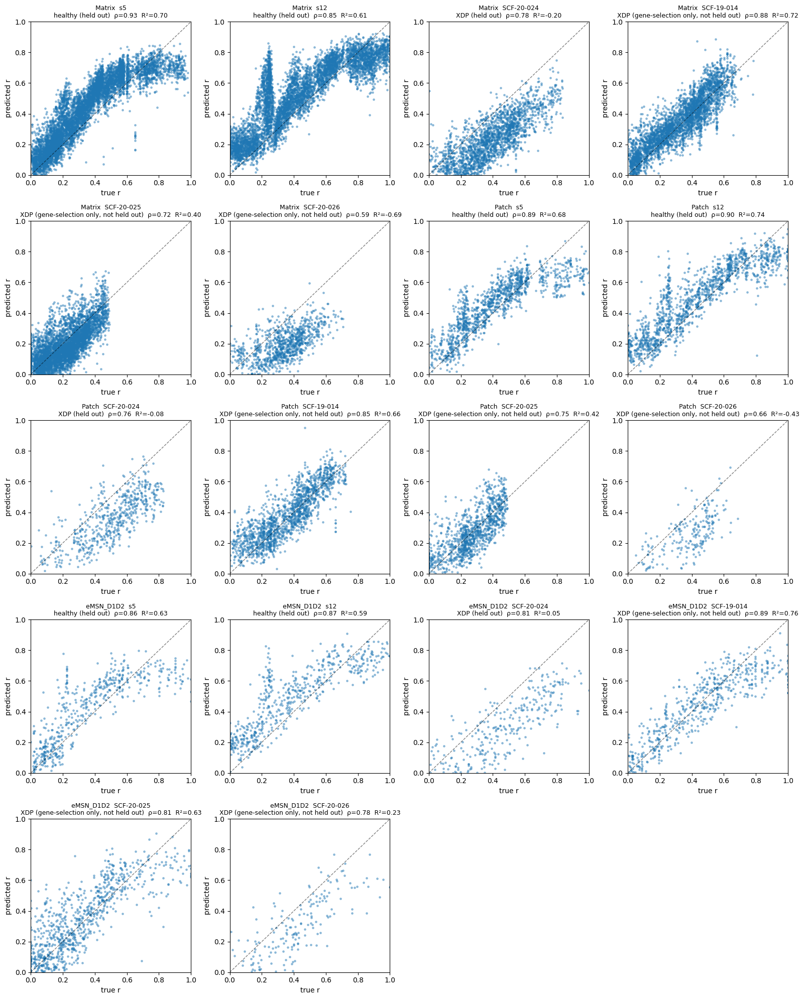

In [14]:
ncols = 4
nrows = int(np.ceil(len(results) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows), squeeze=False)
axes = axes.flatten()

for ax, res in zip(axes, results):
    ax.scatter(res["y_true"], res["y_pred"], s=6, alpha=0.4)
    ax.plot([0, 1], [0, 1], "k--", lw=1, alpha=0.5)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xlabel("true r"); ax.set_ylabel("predicted r")
    ax.set_title(f"{res['cell_type']}  {res['donor']}\n{res['cohort']}  ρ={res['spearman_rho']:.2f}  R²={res['R2']:.2f}", fontsize=9)

for ax in axes[len(results):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

## 6. Which genes actually carried the model, per cell type

In [15]:
for ct, m in models.items():
    coef_df = pd.DataFrame({"gene": m["genes"], "coef": m["model"].coef_}).sort_values("coef", key=np.abs, ascending=False)
    print(f"=== {ct} — {len(coef_df)} genes, {int((coef_df['coef'] != 0).sum())} with non-zero coefficient after ElasticNet ===")
    display(coef_df[coef_df["coef"] != 0].head(20))

=== Matrix — 429 genes, 148 with non-zero coefficient after ElasticNet ===


,gene,coef
3,PRKG1,-0.029810
196,CNTN5,0.020880
29,CADM1,-0.016071
0,PDE10A,0.014906
12,PSD3,-0.014022
30,ROBO1,-0.013957
8,PLEKHA7,0.013616
72,OCA2,-0.012720
18,CDH12,-0.012001
52,FAM135B,0.011578


=== Patch — 274 genes, 114 with non-zero coefficient after ElasticNet ===


,gene,coef
6,SEMA3A,-0.022641
1,RGS6,-0.020561
25,OCA2,-0.016078
4,VLDLR-AS1,0.015432
35,LINC03000,-0.014530
33,TRPS1,-0.013734
52,CNTN5,0.013205
32,PCSK6,0.011942
131,PLCH1,-0.011596
9,LINC01902,-0.010338


=== eMSN_D1D2 — 355 genes, 158 with non-zero coefficient after ElasticNet ===


,gene,coef
1,ELL2,0.030514
13,PTCHD4,0.019265
258,PAG1,0.015652
0,CNR1,0.014227
73,TOX,0.013350
239,NECTIN3,-0.012855
6,CADM1,-0.012782
10,SYNDIG1,0.012138
37,SORCS3,-0.011455
7,TENM3,-0.011019


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

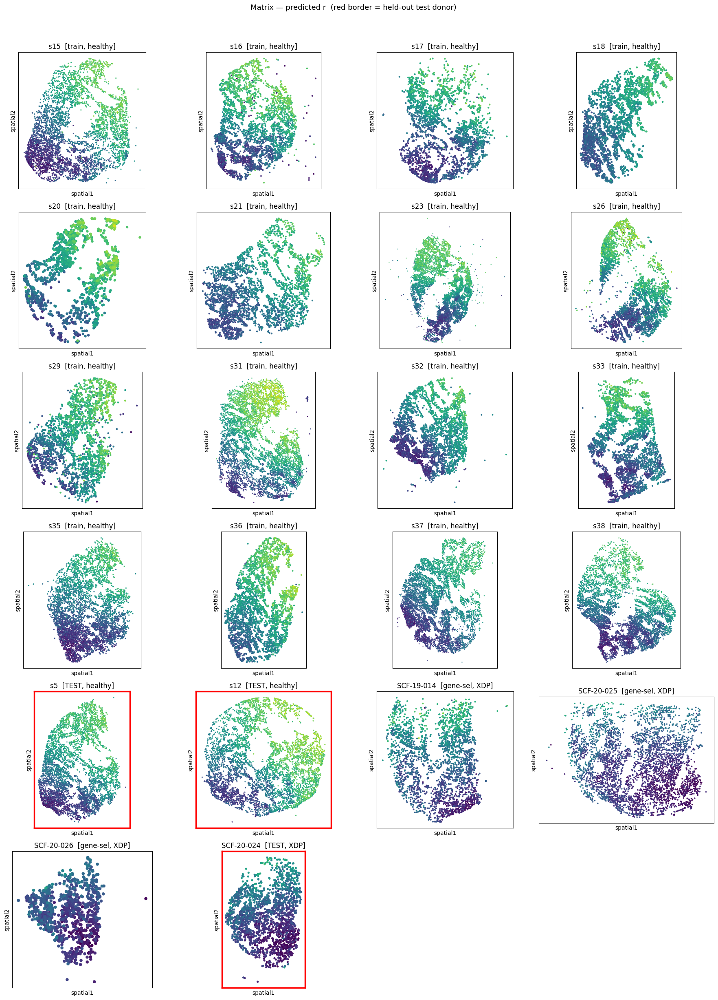

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

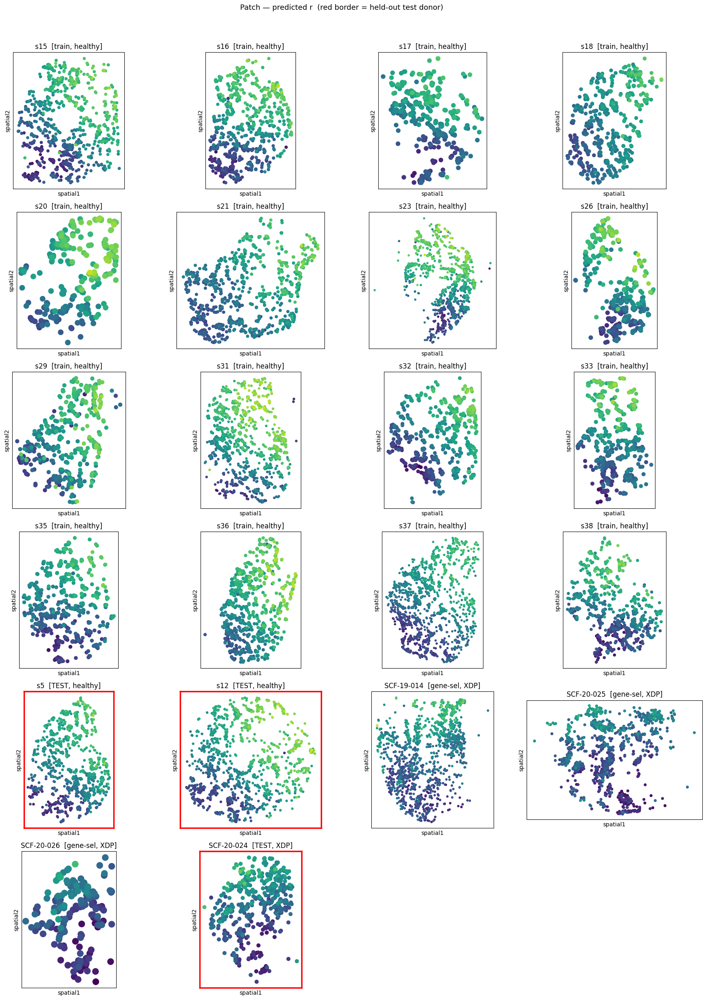

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

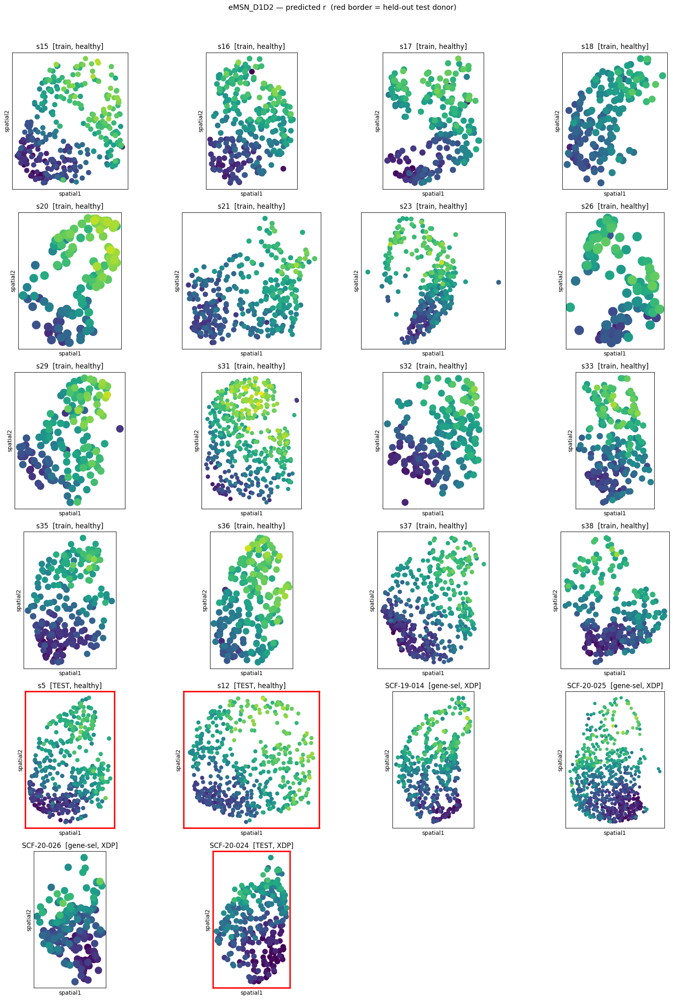

In [16]:
for ad in [adata_train, adata_test, xdp_train, xdp_test]:
    ad.obs["r_pred"] = np.nan

for ct in models:
    genes = models[ct]["genes"]
    for ad in [adata_train, adata_test, xdp_train, xdp_test]:
        mask = (ad.obs["ct"] == ct).values
        if mask.sum() == 0:
            continue
        X = ad[mask, genes].layers["log1p_norm"]
        X = X.toarray() if sparse.issparse(X) else np.asarray(X)
        Xs = models[ct]["scaler"].transform(X)
        ad.obs.loc[mask, "r_pred"] = models[ct]["model"].predict(Xs)

# (split, cohort, donor, source_adata) for every donor we have — train donors first, test donors last.
# "gene-sel" (not "train") for XDP-train donors: the regressor never saw them, only step 3's gene selection did.
panels = (
    [("train",    "healthy", d, adata_train) for d in TRAIN_HEALTHY_DONORS] +
    [("TEST",     "healthy", d, adata_test)  for d in TEST_HEALTHY_DONORS] +
    [("gene-sel", "XDP",     d, xdp_train)   for d in TRAIN_XDP_DONORS] +
    [("TEST",     "XDP",     d, xdp_test)    for d in TEST_XDP_DONORS]
)

for ct in models:
    panels_ct = [
        (split, cohort, donor, ad[(ad.obs["donor_id"] == donor) & (ad.obs["ct"] == ct)])
        for split, cohort, donor, ad in panels
    ]
    panels_ct = [p for p in panels_ct if p[3].n_obs > 0]

    ncols = 4
    nrows = int(np.ceil(len(panels_ct) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 4 * nrows), squeeze=False)
    axes = axes.flatten()

    for ax, (split, cohort, donor, ad_d) in zip(axes, panels_ct):
        sc.pl.embedding(
            ad_d, basis="spatial", color="r_pred",
            title=f"{donor}  [{split}, {cohort}]",
            ax=ax, show=False, colorbar_loc=None, vmin=0, vmax=1,
        )
        ax.set_aspect("equal")
        if split == "TEST":   # highlight held-out donors so a spatial failure mode is easy to spot
            for spine in ax.spines.values():
                spine.set_edgecolor("red")
                spine.set_linewidth(2.5)

    for ax in axes[len(panels_ct):]:
        ax.set_visible(False)

    fig.suptitle(f"{ct} — predicted r  (red border = held-out test donor)", y=1.02, fontsize=13)
    plt.tight_layout()
    plt.show()

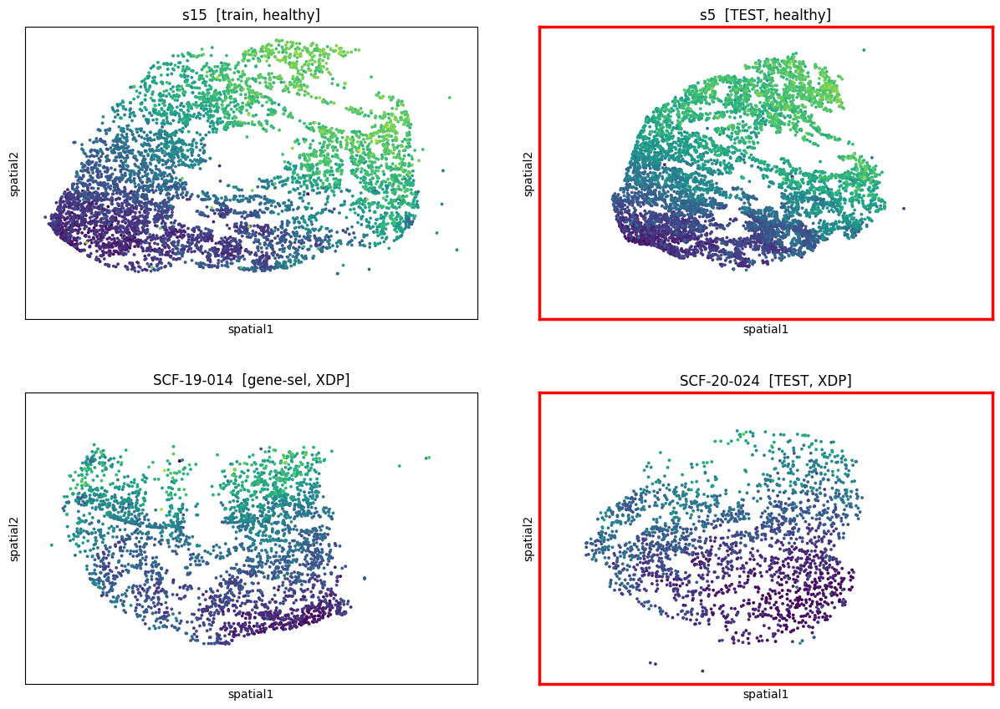

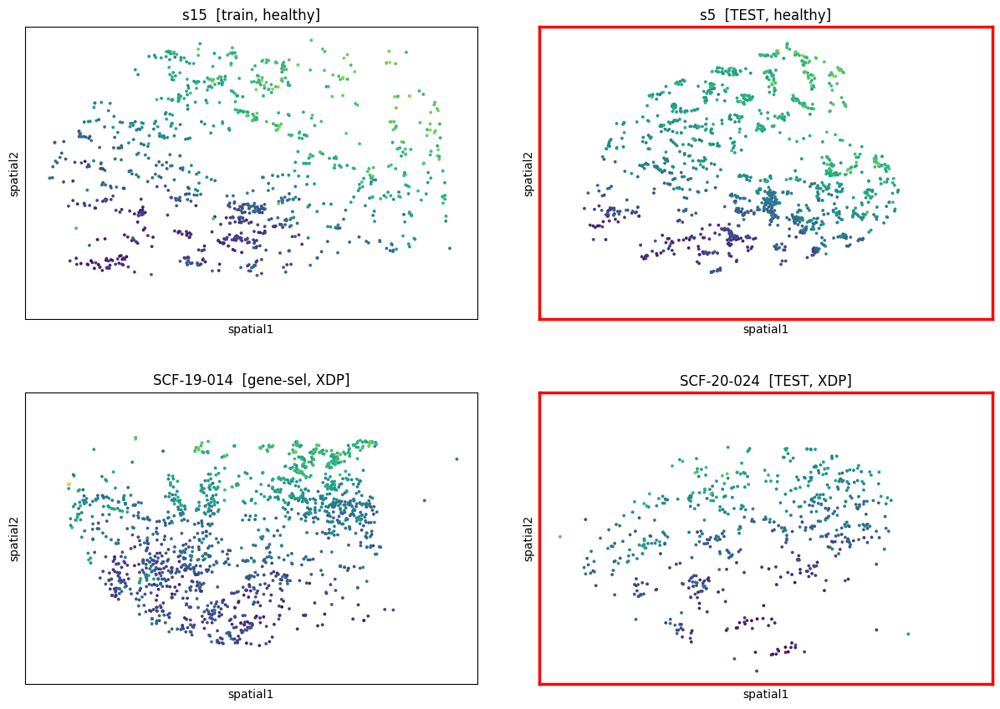

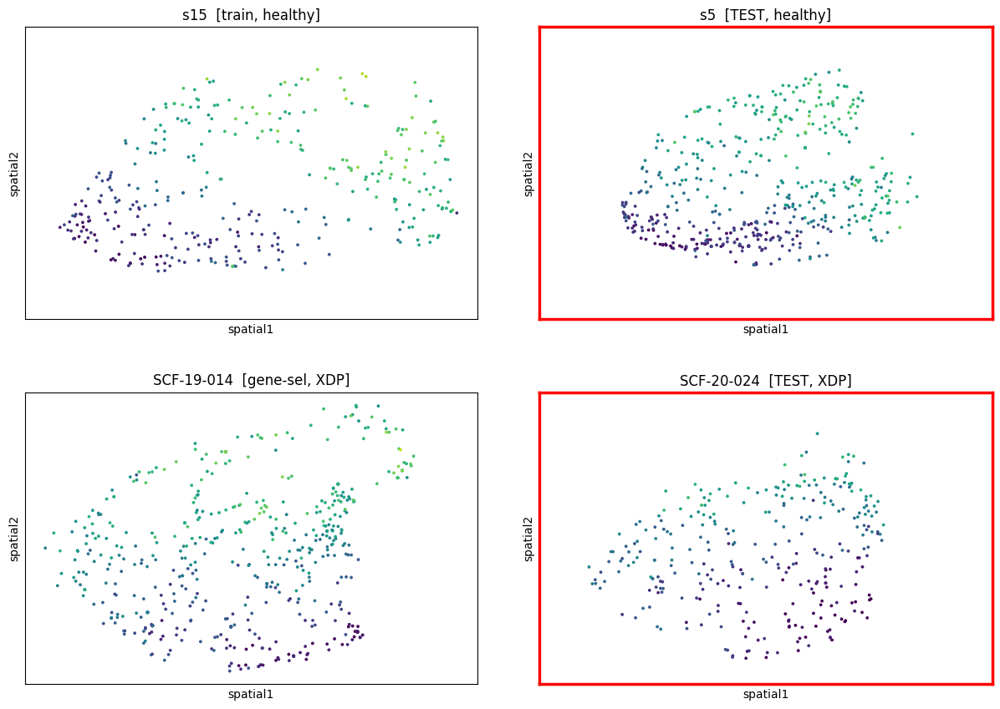

In [33]:
for ct in models:
    coords_list, rpred_list, titles, splits, color_cols = [], [], [], [], []
    for split, cohort, donor, ad in panels:
        ad_d = ad[(ad.obs["donor_id"] == donor) & (ad.obs["ct"] == ct)]
        if ad_d.n_obs == 0:
            continue
        coords_list.append(ad_d.obsm["spatial"] - ad_d.obsm["spatial"].mean(axis=0))  # recenter
        rpred_list.append(ad_d.obs["r_pred"].values)
        titles.append(f"{donor}  [{split}, {cohort}]")
        splits.append(split)
        color_cols.append(f"r_pred_{len(color_cols)}")

    if not coords_list:
        continue

    n_each     = [len(c) for c in coords_list]
    coords_all = np.vstack(coords_list)

    obs = pd.DataFrame(index=[f"cell_{i}" for i in range(coords_all.shape[0])])
    start = 0
    for col, n, rpred in zip(color_cols, n_each, rpred_list):
        obs[col] = np.nan
        obs.iloc[start:start + n, obs.columns.get_loc(col)] = rpred
        start += n

    ad_combined = sc.AnnData(X=np.zeros((coords_all.shape[0], 1)), obs=obs)
    ad_combined.obsm["spatial"] = coords_all

    axes = sc.pl.embedding(
        ad_combined, basis="spatial", color=color_cols, title=titles,
        ncols=2, vmin=0, vmax=1, colorbar_loc=None,
        na_color=(0, 0, 0, 0), show=False, size=30
    )
    for ax, split in zip(axes, splits):
        if split == "TEST":
            for spine in ax.spines.values():
                spine.set_edgecolor("red")
                spine.set_linewidth(2.5)

    #plt.gcf().suptitle(f"{ct} — predicted r  (red border = held-out test donor)", y=1.05, fontsize=13)
    plt.show()


# Predict r in XDP-Nucseq

In [18]:
nucseq_xdp = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/adatas/Striatum/Striatum_combined_QC_mmc_ct-cured_zoned.h5ad", backed="r")
nucseq_xdp = nucseq_xdp[nucseq_xdp.obs["ct_for_deg"].isin(["Matrix_D1", "Matrix_D2", "Patch_D1", "Patch_D2", "eMSN_D1D2"])].to_memory().copy()
nucseq_xdp.obs["ct"] = nucseq_xdp.obs["ct_for_deg"].map(ct_map)
nucseq_xdp.obs["r"] = np.nan

In [19]:
# predict r for the nucseq XDP dataset using the same models trained on the spatial data
# gene_symbol var_names + the same normalize_total/log1p recipe the models were trained on,
# so expression is on the scale the frozen scalers expect
nucseq_xdp.var_names = nucseq_xdp.var["gene_symbol"].astype(str).copy()
nucseq_xdp.var_names_make_unique()
nucseq_xdp = process_adata(nucseq_xdp)

def predict_r_full_gene_list(ad, ct):
    genes = models[ct]["genes"]
    mask = (ad.obs["ct"] == ct).values
    if mask.sum() == 0:
        return None, None

    present = [g for g in genes if g in ad.var_names]
    missing = [g for g in genes if g not in ad.var_names]
    if missing:
        print(f"[{ct}] {len(missing)}/{len(genes)} model genes not found in nucseq_xdp — imputed as 0 expr: {missing[:10]}{'...' if len(missing) > 10 else ''}")

    X_present = ad[mask, present].layers["log1p_norm"]
    X_present = X_present.toarray() if sparse.issparse(X_present) else np.asarray(X_present)

    # keep the exact gene order the scaler/model were fit on; missing genes = 0 (not detected)
    X = pd.DataFrame(0.0, index=ad.obs_names[mask], columns=genes)
    X.loc[:, present] = X_present

    Xs = models[ct]["scaler"].transform(X.values)
    return mask, models[ct]["model"].predict(Xs)




for ct in models:
    mask, r_pred = predict_r_full_gene_list(nucseq_xdp, ct)
    if mask is None:
        continue
    nucseq_xdp.obs.loc[mask, "r"] = r_pred

print(nucseq_xdp.obs.groupby("ct")["r"].describe())


[Patch] 2/274 model genes not found in nucseq_xdp — imputed as 0 expr: ['LINC03000', 'IQCA1']
[eMSN_D1D2] 3/355 model genes not found in nucseq_xdp — imputed as 0 expr: ['DIRC3-AS1', 'GDNF-AS1', 'LINC01122']
             count      mean       std       min       25%       50%  \
ct                                                                     
Matrix     22782.0  0.426821  0.191283 -0.053668  0.269695  0.414008   
Patch       7269.0  0.532244  0.168027 -0.025018  0.414849  0.548973   
eMSN_D1D2   2830.0  0.486866  0.173034 -0.049148  0.368005  0.499645   

                75%       max  
ct                             
Matrix     0.584145  1.038578  
Patch      0.657805  0.977380  
eMSN_D1D2  0.613743  0.990381  


In [20]:
# same random-effects correlation used everywhere else in this notebook — here `r` is not a
# real spline coordinate, it's the model's *prediction*, used as a physical-location proxy
corr_nucseq = {}
for ct in models:
    corr_nucseq[ct] = {}
    for cond in nucseq_xdp.obs["condition"].dropna().unique():
        sub = nucseq_xdp[(nucseq_xdp.obs["ct"] == ct) & (nucseq_xdp.obs["condition"] == cond)]
        try:
            corr_nucseq[ct][cond] = calc_spatial_corr_multi_donor(sub, metric_key="r")
        except ValueError as e:
            print(f"[{ct} / {cond}] {e}")

for ct in corr_nucseq:
    for cond, df in corr_nucseq[ct].items():
        print(f"=== {ct} — {cond} — genes most correlated with predicted r ===")
        display(df.sort_values("rho", key=np.abs, ascending=False).head(15))

    # sanity check: do the genes the regressor actually used still show a gradient
    # against predicted r in this independent (non-spatial) cohort?
    for cond, df in corr_nucseq[ct].items():
        genes_present = [g for g in models[ct]["genes"] if g in df.index]
        print(f"[{ct} / {cond}] model genes — mean |rho| = {df.loc[genes_present, 'rho'].abs().mean():.3f}  "
              f"({len(genes_present)}/{len(models[ct]['genes'])} genes present)")


=== Matrix — XDP — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
PRKG1,-0.603320,7.780846e-110,29,1.019641e-105
PLCB1,0.541863,3.061867e-97,29,1.604969e-93
SLC24A2,0.528450,9.477867e-72,29,1.981816e-68
ZNF385B,0.515726,1.062925e-62,29,1.160759e-59
HCN1,-0.502033,3.891287e-101,29,2.549669e-97
PDE10A,0.486609,4.831969e-94,29,2.110685e-90
PDE1C,-0.485127,1.020754e-63,29,1.216043e-60
DACH1,0.481234,3.886676e-159,29,1.018659e-154
LARGE1,0.477344,4.332192e-80,29,1.261582e-76


=== Matrix — Control — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
PRKG1,-0.763161,5.490560e-204,17,1.439021e-199
ZNF385B,0.670113,1.835261e-85,17,2.405018e-82
RYR3,0.651352,8.476407e-97,17,1.481054e-93
PLCB1,0.627559,1.373092e-38,17,1.864630e-36
GDA,-0.622805,5.468004e-159,17,7.165546e-155
PDE10A,0.619597,1.271175e-35,17,1.528268e-33
EPB41,0.613277,3.193702e-104,17,6.975311e-101
TESPA1,0.607179,2.129339e-49,17,5.215687e-47
PLEKHA7,0.607148,2.906321e-72,17,2.457154e-69


[Matrix / XDP] model genes — mean |rho| = 0.182  (429/429 genes present)
[Matrix / Control] model genes — mean |rho| = 0.239  (429/429 genes present)
=== Patch — XDP — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
RGS6,-0.576500,1.166425e-82,29,3.057083e-78
CNTN5,0.547314,5.513392e-75,29,4.816683e-71
PDE10A,0.536301,2.668498e-31,29,1.626481e-28
RYR3,0.522796,1.663156e-64,29,8.717933e-61
GDA,-0.483054,2.671812e-29,29,1.250456e-26
PRKG1,-0.476467,3.665987e-40,29,6.405457e-37
PLCB1,0.473563,2.411195e-30,29,1.316562e-27
SEMA3A,-0.462274,1.713789e-71,29,1.122917e-67
VLDLR-AS1,0.458216,1.233978e-81,29,1.617067e-77


=== Patch — Control — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
RGS6,-0.602147,1.604377e-101,17,4.204912e-97
PDE10A,0.543597,7.948313e-28,17,2.853662e-25
RYR3,0.527200,3.381094e-46,17,4.430754e-43
ROBO1,-0.492691,8.242683e-56,17,3.086178e-52
SEMA3A,-0.489745,1.819473e-31,17,9.934700e-29
VLDLR-AS1,0.467425,3.842424e-52,17,9.155099e-49
ZNF385B,0.451452,5.649073e-28,17,2.056341e-25
PCDH11X,-0.447262,9.719069e-86,17,1.273635e-81
EPB41,0.443099,6.271600e-25,17,1.627449e-22


[Patch / XDP] model genes — mean |rho| = 0.212  (272/274 genes present)
[Patch / Control] model genes — mean |rho| = 0.198  (272/274 genes present)
=== eMSN_D1D2 — XDP — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
TENM3,-0.452425,2.099291e-32,25,5.001847e-29
CADM1,-0.449920,7.102122e-30,25,1.329568e-26
KCTD8,-0.411261,4.863500e-30,25,9.805191e-27
CAMK2D,-0.407003,2.907470e-60,25,7.620188e-56
PTCHD4,0.405551,1.180548e-25,25,1.289207e-22
MCTP1,0.402293,1.611269e-22,25,1.279689e-19
NDST3,-0.401784,5.434733e-34,25,1.780486e-30
CFAP47,-0.389795,8.599238e-25,25,9.015098e-22
ST6GALNAC5,-0.385073,1.428167e-26,25,1.871542e-23


=== eMSN_D1D2 — Control — genes most correlated with predicted r ===


,rho,pval,n_donors,padj
gene_symbol,,,,
PTCHD4,0.571165,1.490569e-32,17,9.766581e-29
ELL2,0.565358,3.693129e-29,17,1.935864e-25
MCTP1,0.468732,2.200186e-57,17,5.766467e-53
NDST3,-0.458220,6.600821e-24,17,2.162511e-20
CNR1,0.455228,2.420195e-12,17,8.346170e-10
CAMK2D,-0.441527,8.821229e-20,17,1.444972e-16
TENM3,-0.435931,3.779700e-34,17,3.302072e-30
OPCML,0.433332,6.433165e-17,17,6.484878e-14
ZNF385B,0.426338,8.685566e-22,17,2.195163e-18


[eMSN_D1D2 / XDP] model genes — mean |rho| = 0.182  (352/355 genes present)
[eMSN_D1D2 / Control] model genes — mean |rho| = 0.188  (352/355 genes present)


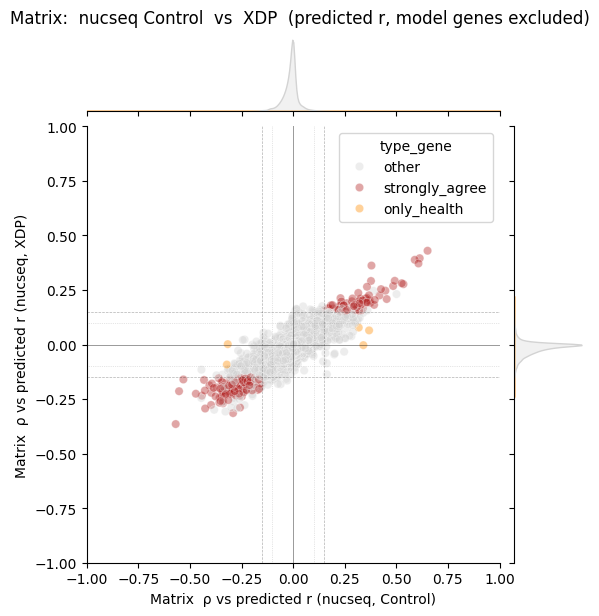

type_gene
other             25587
strongly_agree      188
only_health           5
Name: Matrix: nucseq Control vs XDP (non-model genes), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


only_health (Control-only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,
ELL2,0.368048,7.574831e-26,0.065024,0.015503,0.779768,6.651567,0.621081,2.825969,only_health
PDE8B,0.340236,1.223725e-31,-0.002699,1.000000,0.972275,19.751294,0.936312,11.990002,only_health
PKP2,-0.321124,3.098681e-37,-0.091706,0.000004,0.447752,2.005995,0.496791,2.138361,only_health
GRIN2A,0.317943,7.841969e-20,0.077798,0.009424,0.852589,21.879428,0.840903,13.609849,only_health
LOC102546299,-0.316693,3.386717e-19,0.001836,1.000000,0.996594,175.477520,0.987534,139.245495,only_health


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


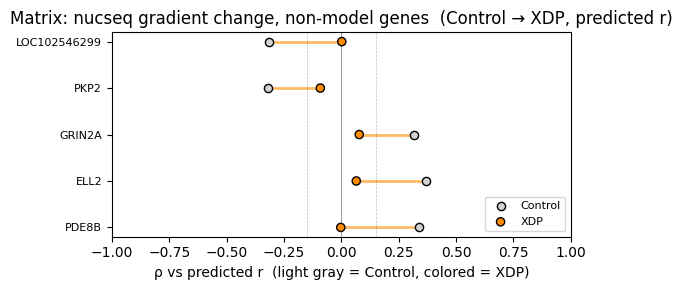

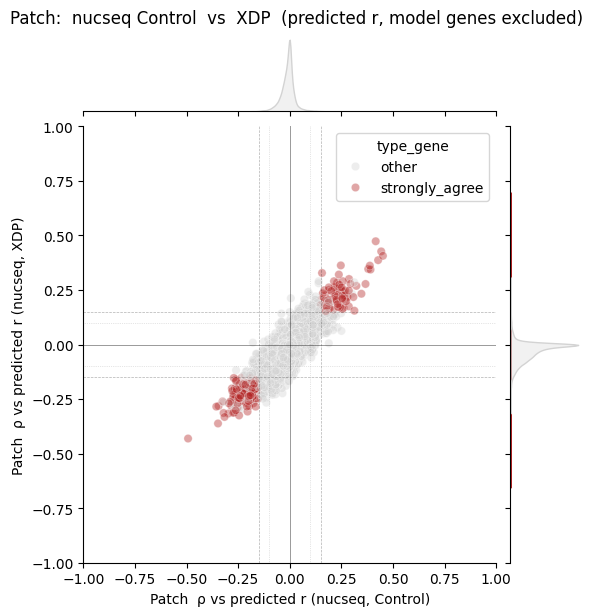

type_gene
other             25711
strongly_agree      226
Name: Patch: nucseq Control vs XDP (non-model genes), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


only_health (Control-only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


Patch: nucseq gradient change, non-model genes  (Control → XDP, predicted r): no genes to plot


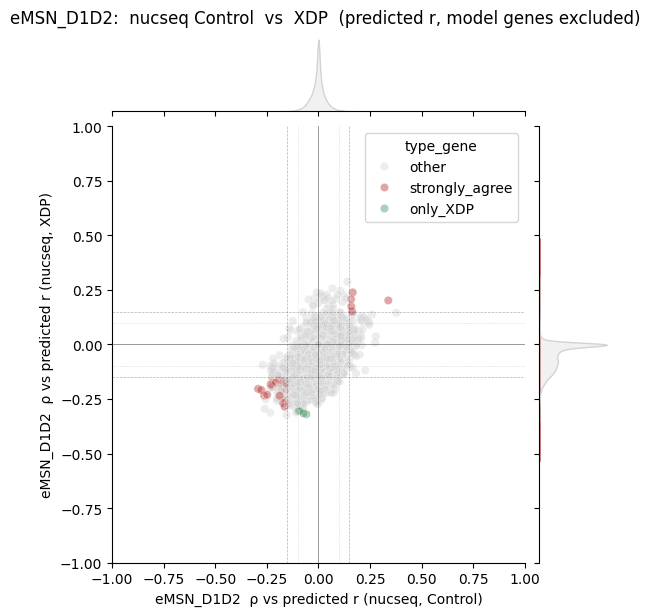

type_gene
other             25826
strongly_agree       27
only_XDP              4
Name: eMSN_D1D2: nucseq Control vs XDP (non-model genes), dtype: int64

strongly_disagree (reversed)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


only_health (Control-only)


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,


only_XDP


,rho_health,padj_health,rho_xdp,padj_xdp,pct_expr_health,mean_expr_health,pct_expr_xdp,mean_expr_xdp,type_gene
gene_symbol,,,,,,,,,
NORAD,-0.058813,0.872102,-0.319880,1.613549e-10,0.747232,4.202952,0.589920,2.270905,only_XDP
WSB1,-0.072279,0.520211,-0.315802,7.480653e-10,0.741697,5.439114,0.638030,3.016037,only_XDP
SERINC1,-0.097569,0.569224,-0.305061,1.317347e-10,0.765683,4.105166,0.628866,2.671821,only_XDP
SARAF,-0.091203,0.692153,-0.303071,5.671240e-11,0.726937,3.171587,0.564147,1.814433,only_XDP


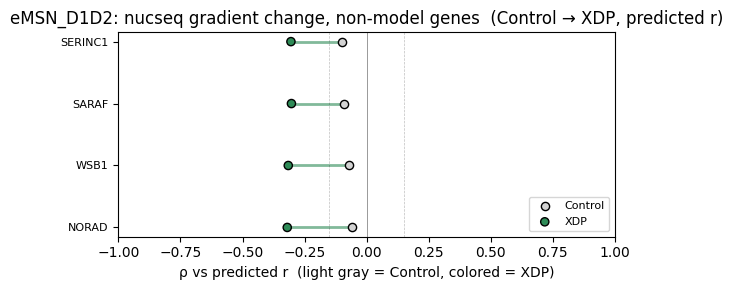

In [21]:


def plot_gradient_change(df, rho_cx, rho_cy, palette, title):
    """Dumbbell/slope chart: one horizontal line per gene from rho_cx to rho_cy."""
    if len(df) == 0:
        print(f"{title}: no genes to plot")
        return
    df = df.assign(delta=df[rho_cy] - df[rho_cx]).sort_values("delta")
    y_pos = np.arange(len(df))
    colors = df["type_gene"].map(palette) if "type_gene" in df.columns else "steelblue"

    fig, ax = plt.subplots(figsize=(6, max(3, 0.28 * len(df))))
    ax.hlines(y_pos, df[rho_cx], df[rho_cy], color=colors, alpha=0.6, lw=2, zorder=1)
    ax.scatter(df[rho_cx], y_pos, color="lightgray", edgecolor="k", s=35, label="Control", zorder=3)
    ax.scatter(df[rho_cy], y_pos, c=colors, edgecolor="k", s=35, label="XDP", zorder=3)

    ax.set_yticks(y_pos)
    ax.set_yticklabels(df.index, fontsize=8)
    ax.axvline(0, color="k", lw=0.7, alpha=0.4)
    ax.axvline(-THRESHOLD, color="k", lw=0.5, ls="--", alpha=0.25)
    ax.axvline(THRESHOLD, color="k", lw=0.5, ls="--", alpha=0.25)
    ax.set_xlim(-1, 1)
    ax.set_xlabel("ρ vs predicted r  (light gray = Control, colored = XDP)")
    ax.set_title(title)
    ax.legend(fontsize=8, loc="lower right")
    plt.tight_layout()
    plt.show()


palette = {
    "strongly_agree":    "firebrick",
    "strongly_disagree": "steelblue",
    "only_health":       "darkorange",
    "only_XDP":          "seagreen",
    "other":             "lightgray",
}


def merge_nucseq_conditions(ct, cond_x="Control", cond_y="XDP"):
    corr_x, corr_y = corr_nucseq[ct][cond_x], corr_nucseq[ct][cond_y]
    common = corr_x.index.intersection(corr_y.index)

    expr_x = expr_reliability_stats(nucseq_xdp[nucseq_xdp.obs["condition"] == cond_x], ct)
    expr_y = expr_reliability_stats(nucseq_xdp[nucseq_xdp.obs["condition"] == cond_y], ct)

    return pd.DataFrame({
        "rho_health":       corr_x.loc[common, "rho"],
        "padj_health":      corr_x.loc[common, "padj"],
        "rho_xdp":          corr_y.loc[common, "rho"],
        "padj_xdp":         corr_y.loc[common, "padj"],
        "pct_expr_health":  expr_x.loc[common, "pct_expr"],
        "mean_expr_health": expr_x.loc[common, "mean_expr"],
        "pct_expr_xdp":     expr_y.loc[common, "pct_expr"],
        "mean_expr_xdp":    expr_y.loc[common, "mean_expr"],
    })


nucseq_agreement_tables = {
    ct: merge_nucseq_conditions(ct)
    for ct in corr_nucseq if {"Control", "XDP"}.issubset(corr_nucseq[ct].keys())
}

for ct, df in nucseq_agreement_tables.items():
    # drop genes that were used to build predicted_r for this cell type — correlating those
    # against predicted_r is circular; only genes outside the model panel can tell you
    # something real about nucseq
    df = df.loc[df.index.difference(models[ct]["genes"])]

    rho_cx, rho_cy = "rho_health", "rho_xdp"

    x, y   = df[rho_cx], df[rho_cy]
    sig_x  = df["padj_health"] < PADJ_THR
    sig_y  = df["padj_xdp"]    < PADJ_THR
    expr_x = (df["pct_expr_health"] >= MIN_PCT_EXPR) & (df["mean_expr_health"] >= MIN_MEAN_EXPR)
    expr_y = (df["pct_expr_xdp"]    >= MIN_PCT_EXPR) & (df["mean_expr_xdp"]    >= MIN_MEAN_EXPR)

    has_x  = (x.abs() >= THRESHOLD) & sig_x & expr_x
    has_y  = (y.abs() >= THRESHOLD) & sig_y & expr_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & expr_x & flat_y
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & expr_y & flat_x

    df = df.copy()
    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = "only_health"
    df.loc[only_y,            "type_gene"] = "only_XDP"

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct}  ρ vs predicted r (nucseq, Control)")
    g.ax_joint.set_ylabel(f"{ct}  ρ vs predicted r (nucseq, XDP)")
    g.figure.suptitle(f"{ct}:  nucseq Control  vs  XDP  (predicted r, model genes excluded)", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct}: nucseq Control vs XDP (non-model genes)"))
    print("strongly_disagree (reversed)")
    display(df[df["type_gene"] == "strongly_disagree"].sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print("only_health (Control-only)")
    display(df[df["type_gene"] == "only_health"].sort_values(rho_cx, key=np.abs, ascending=False))
    print("only_XDP")
    display(df[df["type_gene"] == "only_XDP"].sort_values(rho_cy, key=np.abs, ascending=False))

    changed = df[df["type_gene"].isin(["strongly_disagree", "only_health", "only_XDP"])]
    plot_gradient_change(changed, rho_cx, rho_cy, palette, f"{ct}: nucseq gradient change, non-model genes  (Control → XDP, predicted r)")


# Analyse full bican

In [16]:
p1_bican = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/BICAN/whole_bican/STR_D1_Striosome_MSN.h5ad")
p2_bican = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/BICAN/whole_bican/STR_D2_Striosome_MSN.h5ad")

patch_bican = sc.concat([p1_bican, p2_bican], axis=0)

In [ ]:
patch_bican.obs_names_make_unique()
patch_bican.obs["ct"] = "Patch"
patch_bican.layers["counts"] = patch_bican.X.copy()

patch_bican = process_adata(patch_bican)   # same normalize_total + log1p recipe as everywhere else

print(patch_bican)
print(patch_bican.obs["donor_id"].value_counts())

# make sure this is actually independent of what the model/gene-selection already saw
overlap = set(patch_bican.obs["donor_id"].unique()) & set(TRAIN_HEALTHY_DONORS + TEST_HEALTHY_DONORS)
if overlap:
    print(f"WARNING: {len(overlap)} donors already used elsewhere in this notebook: {overlap}")



AnnData object with n_obs × n_vars = 204480 × 22561
    obs: 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_intronic', 'pct_mt', 'frac_contamination', 'donor_external_id', 'biobank', 'age', 'pmi_hr', 'imputed_sex', 'toxicology_report_complete', 'mmc_neighborhood_name', 'mmc_neighborhood_bootstrapping_probability', 'mmc_class_name', 'mmc_class_bootstrapping_probability', 'mmc_subclass_name', 'mmc_subclass_bootstrapping_probability', 'mmc_group_name', 'mmc_group_bootstrapping_probability', 'mmc_cluster_name', 'mmc_cluster_bootstrapping_probability', 'neuropath_diagnosis', 'village', 'brain_region_abbreviation', 'is_primary_data', 'donor_id', 'n_counts', 'zone', 'zone_probs', 'ct'
    var: 'n_cells'
    uns: 'log1p'
    layers: 'counts', 'log1p_norm'
donor_id
MS243232      6720
UMBEB24113    5252
UMBEB24053    4748
UMBEB23069    4119
MS5423        4076
              ... 
MS544811        63
PT13904         32
MLS19656        28
UMBEB23083       5
PT14073       

NameError: name 'predict_r_full_gene_list' is not defined

In [19]:
# impute r with the frozen Patch model — reuses the missing-gene-safe helper from the nucseq step
mask, r_pred = predict_r_full_gene_list(patch_bican, "Patch")
patch_bican.obs["r"] = np.nan
patch_bican.obs.loc[mask, "r"] = r_pred

In [20]:
corr_patch_bican_imputed = calc_spatial_corr_multi_donor(patch_bican, metric_key="r")

In [21]:
import grad_fun as gf


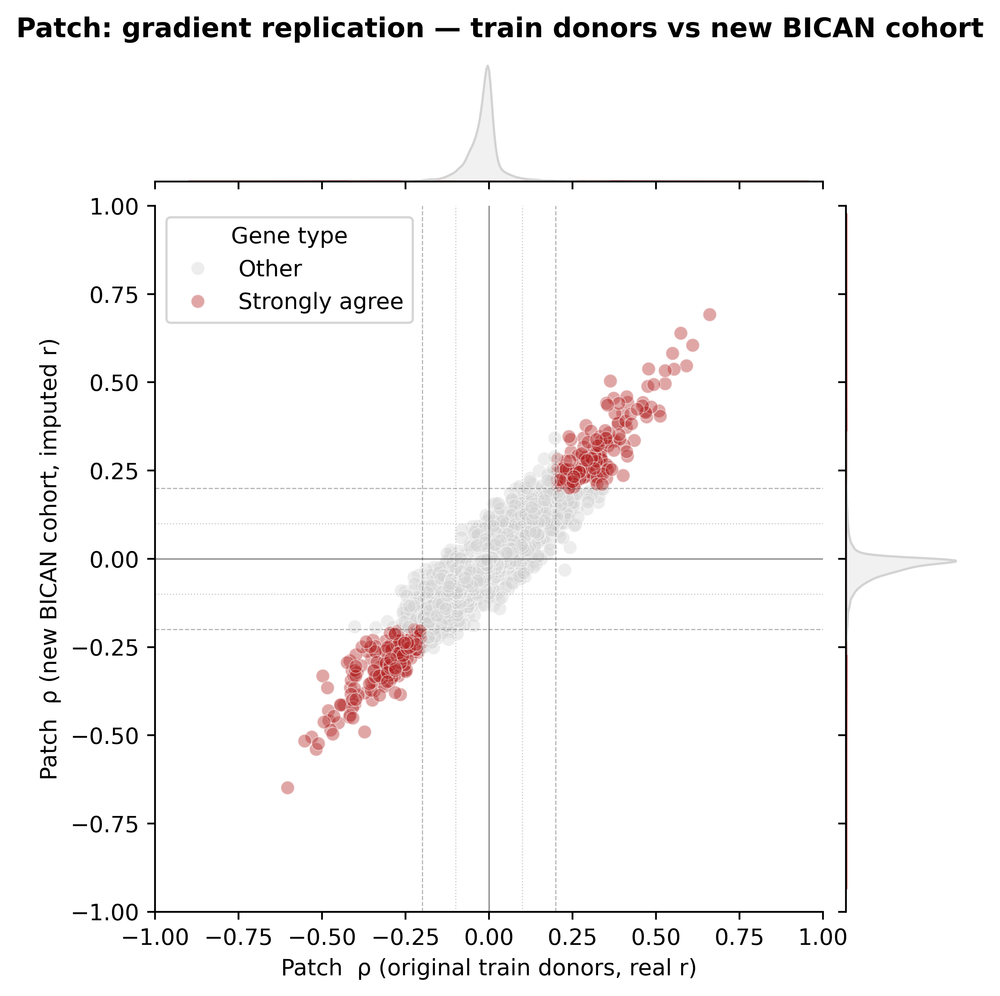

Gene type
Other             22044
Strongly agree      375
Name: Patch: train vs new BICAN, dtype: int64

,rho_train,padj_train,rho_new,padj_new,Gene type,was_used_in_model
PDE8B,0.461071,4.227848e-31,0.442635,1.169233e-250,Strongly agree,False
OGT,0.011013,8.313500e-01,0.018720,4.583363e-02,Other,False


strongly_agree (375)


,rho_train,padj_train,rho_new,padj_new,Gene type,was_used_in_model
PDE10A,0.661036,1.631771e-167,0.691727,0.000000e+00,Strongly agree,True
OPCML,0.610042,3.671484e-88,0.604927,0.000000e+00,Strongly agree,False
RGS6,-0.602842,7.040159e-72,-0.648819,0.000000e+00,Strongly agree,True
ZNF385B,0.591539,1.054444e-88,0.546649,6.919541e-305,Strongly agree,False
RYR3,0.574512,8.385632e-83,0.638998,0.000000e+00,Strongly agree,True
...,...,...,...,...,...,...
AKAP13,-0.202577,3.846302e-25,-0.202091,2.094021e-168,Strongly agree,False
SRPK1,0.202086,6.318405e-18,0.212166,3.562040e-116,Strongly agree,False
TSPAN7,-0.201076,1.410661e-23,-0.237935,1.796646e-303,Strongly agree,True
VAV1,0.200170,1.864515e-52,0.221010,8.415909e-231,Strongly agree,False


strongly_disagree (0) — sign flips between train donors and new BICAN cohort


,rho_train,padj_train,rho_new,padj_new,Gene type,was_used_in_model


only_train (0) — graded in original train donors, flat in new BICAN cohort


,rho_train,padj_train,rho_new,padj_new,Gene type,was_used_in_model


only_new (0) — graded in new BICAN cohort, flat in original train donors


,rho_train,padj_train,rho_new,padj_new,Gene type,was_used_in_model


In [35]:
common = corr_patch_bican_imputed.index.intersection(corr_health_train["Patch"].index)

df = pd.DataFrame({
    "rho_train":  corr_health_train["Patch"].loc[common, "rho"],
    "padj_train": corr_health_train["Patch"].loc[common, "padj"],
    "rho_new":    corr_patch_bican_imputed.loc[common, "rho"],
    "padj_new":   corr_patch_bican_imputed.loc[common, "padj"],
})

rho_cx, rho_cy = "rho_train", "rho_new"

x, y  = df[rho_cx], df[rho_cy]
sig_x = df["padj_train"] < PADJ_THR
sig_y = df["padj_new"]   < PADJ_THR

has_x  = (x.abs() >= THRESHOLD) & sig_x
has_y  = (y.abs() >= THRESHOLD) & sig_y
flat_x = x.abs() < THRESHOLD_ONLY
flat_y = y.abs() < THRESHOLD_ONLY

both_strong       = has_x & has_y
strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & flat_y
only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & flat_x


df["Gene type"] = "Other"
df.loc[strongly_agree,    "Gene type"] = "Strongly agree"
df.loc[strongly_disagree, "Gene type"] = "Strongly disagree"
df.loc[only_x,            "Gene type"] = "Only train"
df.loc[only_y,            "Gene type"] = "Only new"

palette_replication = {
    "Strongly agree":    "firebrick",
    "Strongly disagree": "steelblue",
    "Only train":        "darkorange",
    "Only new":          "seagreen",
    "Other":             "lightgray",
}

g = sns.jointplot(
    data=df, x=rho_cx, y=rho_cy,
    hue="Gene type", palette=palette_replication,
    alpha=0.4, height=6,
    marginal_kws=dict(fill=True, alpha=0.3),
    ylim=(-1, 1), xlim=(-1, 1)
)
for val in [-THRESHOLD, THRESHOLD]:
    g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
    g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
g.ax_joint.set_xlabel("Patch  ρ (original train donors, real r)")
g.ax_joint.set_ylabel("Patch  ρ (new BICAN cohort, imputed r)")
g.figure.suptitle("Patch: gradient replication — train donors vs new BICAN cohort", y=1.02, fontsize=12, fontweight="bold")
g.figure.set_dpi(500)
plt.show()

display(df["Gene type"].value_counts().rename("Patch: train vs new BICAN"))

df["was_used_in_model"] = df.index.isin(models["Patch"]["genes"])

display(df[df.index.isin(["PDE8B", "OGT"])])

df_strongly_agree    = df[df["Gene type"] == "Strongly agree"].sort_values([rho_cx, rho_cy], key=np.abs, ascending=False)
df_strongly_disagree = df[df["Gene type"] == "Strongly disagree"].sort_values([rho_cx, rho_cy], key=np.abs, ascending=False)
df_only_train         = df[df["Gene type"] == "Only train"].sort_values(rho_cx, key=np.abs, ascending=False)
df_only_new            = df[df["Gene type"] == "Only new"].sort_values(rho_cy, key=np.abs, ascending=False)

print(f"strongly_agree ({len(df_strongly_agree)})")
display(df_strongly_agree)

print(f"strongly_disagree ({len(df_strongly_disagree)}) — sign flips between train donors and new BICAN cohort")
display(df_strongly_disagree)

print(f"only_train ({len(df_only_train)}) — graded in original train donors, flat in new BICAN cohort")
display(df_only_train)

print(f"only_new ({len(df_only_new)}) — graded in new BICAN cohort, flat in original train donors")
display(df_only_new)
